# Qwen 입력 프레임 확인

Qwen video input may miss the accident moment. This notebook extracts the exact 48 frames we will inspect before changing the Qwen input format.


In [1]:
from pathlib import Path
import csv
import json
import random
import math
from collections import Counter

import cv2
from PIL import Image, ImageDraw
from IPython.display import display, Markdown

RUNPOD_ROOT = Path("/workspace/SKN27-FINAL-3Team")
PROJECT_ROOT = RUNPOD_ROOT if RUNPOD_ROOT.exists() else Path.cwd()
for candidate in [PROJECT_ROOT, *PROJECT_ROOT.parents]:
    if (candidate / "ai").exists() and (candidate / "etl").exists() and (candidate / "storage").exists():
        PROJECT_ROOT = candidate
        break

QWEN_OUTPUT_DIR = PROJECT_ROOT / "storage/vision/outputs/qwen_accident_visibility"
QWEN_CSV = QWEN_OUTPUT_DIR / "qwen_accident_visibility_sample20.csv"
QWEN_MANIFEST = PROJECT_ROOT / "storage/vision/datasets/classification/manifests/qwen_visibility_sample20_download_manifest.csv"
FRAME_OUTPUT_DIR = PROJECT_ROOT / "storage/vision/outputs/qwen_frame_inspection"

FRAME_COUNT = 48
RANDOM_SEED = 42
TARGET_RECOMMENDED_USE = {"exclude", "review", ""}
TARGET_VISIBILITY = {"unclear", "not_visible", "uncertain", ""}
MAX_VIDEOS_TO_SHOW = 4

print("PROJECT_ROOT:", PROJECT_ROOT)
print("QWEN_CSV exists:", QWEN_CSV.exists(), QWEN_CSV)
print("QWEN_MANIFEST exists:", QWEN_MANIFEST.exists(), QWEN_MANIFEST)


PROJECT_ROOT: /workspace/SKN27-FINAL-3Team
QWEN_CSV exists: True /workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_accident_visibility/qwen_accident_visibility_sample20.csv
QWEN_MANIFEST exists: True /workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/manifests/qwen_visibility_sample20_download_manifest.csv


In [2]:
def read_csv(path):
    with Path(path).open("r", encoding="utf-8", newline="") as f:
        return list(csv.DictReader(f))


def resolve_path(value):
    path = Path(value or "")
    if path.is_absolute():
        return path
    return PROJECT_ROOT / path


def load_rows():
    if QWEN_CSV.exists():
        rows = read_csv(QWEN_CSV)
        source = QWEN_CSV
    elif QWEN_MANIFEST.exists():
        rows = read_csv(QWEN_MANIFEST)
        source = QWEN_MANIFEST
    else:
        raise FileNotFoundError("Qwen result CSV or Qwen sample manifest is required.")
    return rows, source


rows, source = load_rows()
print("source:", source)
print("rows:", len(rows))
print("recommended_use:", dict(Counter(row.get("recommended_use", "") for row in rows)))
print("accident_visibility:", dict(Counter(row.get("accident_visibility", "") for row in rows)))
print("labels:", dict(Counter(row.get("coarse_label", "") for row in rows)))


source: /workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_accident_visibility/qwen_accident_visibility_sample20.csv
rows: 80
recommended_use: {'exclude': 25, 'review': 49, '': 6}
accident_visibility: {'unclear': 73, '': 6, 'uncertain': 1}
labels: {'차대보행자': 20, '차대이륜차': 20, '차대자전거': 20, '차대차': 20}


## 확인 대상 선택

Prioritize rows that Qwen marked as exclude, review, unclear, or uncertain. Set TARGET_ASSET_IDS to inspect specific videos.


In [3]:
TARGET_ASSET_IDS = []  # ?: ["aihub_train_00000536", "aihub_train_00000396"]

candidates = []
for row in rows:
    asset_id = row.get("asset_id", "")
    if TARGET_ASSET_IDS and asset_id not in TARGET_ASSET_IDS:
        continue
    recommended = row.get("recommended_use", "")
    visibility = row.get("accident_visibility", "")
    if TARGET_ASSET_IDS or recommended in TARGET_RECOMMENDED_USE or visibility in TARGET_VISIBILITY:
        path = resolve_path(row.get("local_path") or row.get("file_path"))
        if path.exists():
            copied = dict(row)
            copied["resolved_path"] = path.as_posix()
            candidates.append(copied)

random.Random(RANDOM_SEED).shuffle(candidates)
selected_rows = candidates[:MAX_VIDEOS_TO_SHOW]

print("candidate_rows:", len(candidates))
print("selected_rows:", len(selected_rows))
for row in selected_rows:
    print(row.get("coarse_label"), row.get("asset_id"), row.get("accident_visibility"), row.get("recommended_use"), row.get("resolved_path"))


candidate_rows: 80
selected_rows: 4
차대자전거 aihub_train_00003410 unclear review /workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대자전거/aihub_train_00003410_bb_1_220218_bike_190_096.mp4
차대차 aihub_train_00010617 unclear exclude /workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대차/aihub_train_00010617_bb_1_140205_vehicle_46_227.mp4
차대이륜차 aihub_train_00001810 unclear review /workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대이륜차/aihub_train_00001810_bb_1_170927_two-wheeled-vehicle_31_001.mp4
차대자전거 aihub_train_00002836 unclear review /workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대자전거/aihub_train_00002836_cc_3_200303_bike_116_279.mp4


In [4]:
def video_meta(video_path):
    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        return {"opened": False}
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    fps = float(cap.get(cv2.CAP_PROP_FPS) or 0.0)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) or 0)
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) or 0)
    duration = frame_count / fps if fps > 0 else 0.0
    cap.release()
    return {
        "opened": True,
        "frame_count": frame_count,
        "fps": round(fps, 3),
        "width": width,
        "height": height,
        "duration_sec": round(duration, 3),
    }


def extract_uniform_frames(video_path, output_dir, frame_count=16):
    output_dir.mkdir(parents=True, exist_ok=True)
    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        raise RuntimeError(f"Could not open video: {video_path}")

    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    fps = float(cap.get(cv2.CAP_PROP_FPS) or 0.0)
    if total <= 0:
        cap.release()
        raise RuntimeError(f"No frames found: {video_path}")

    indices = [round(i * (total - 1) / max(frame_count - 1, 1)) for i in range(frame_count)]
    frame_paths = []
    for order, index in enumerate(indices, start=1):
        cap.set(cv2.CAP_PROP_POS_FRAMES, index)
        ok, frame = cap.read()
        if not ok:
            continue
        time_sec = index / fps if fps > 0 else 0.0
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(frame)
        path = output_dir / f"frame_{order:02d}_{time_sec:06.2f}s.jpg"
        image.save(path, quality=92)
        frame_paths.append((path, time_sec))
    cap.release()
    return frame_paths


def make_contact_sheet(frame_items, output_path, thumb_width=220):
    images = []
    for path, time_sec in frame_items:
        img = Image.open(path).convert("RGB")
        scale = thumb_width / img.width
        thumb = img.resize((thumb_width, max(1, int(img.height * scale))))
        draw = ImageDraw.Draw(thumb)
        draw.rectangle((0, 0, 120, 24), fill=(0, 0, 0))
        draw.text((6, 5), f"{time_sec:.2f}s", fill=(255, 255, 255))
        images.append(thumb)
    if not images:
        raise ValueError("No frames for contact sheet")
    cols = 4
    rows = math.ceil(len(images) / cols)
    w = cols * images[0].width
    h = rows * images[0].height
    sheet = Image.new("RGB", (w, h), (245, 245, 245))
    for idx, img in enumerate(images):
        x = (idx % cols) * img.width
        y = (idx // cols) * img.height
        sheet.paste(img, (x, y))
    output_path.parent.mkdir(parents=True, exist_ok=True)
    sheet.save(output_path, quality=92)
    return output_path


## 프레임 추출 확인

Check each contact sheet and confirm whether the accident moment is included in the 48 sampled frames.


### 차대자전거 / aihub_train_00003410 / unclear / review

{
  "asset_id": "aihub_train_00003410",
  "coarse_label": "차대자전거",
  "accident_visibility": "unclear",
  "recommended_use": "review",
  "video_path": "/workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대자전거/aihub_train_00003410_bb_1_220218_bike_190_096.mp4",
  "contact_sheet": "/workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_frame_inspection/aihub_train_00003410/contact_sheet.jpg",
  "opened": true,
  "frame_count": 150,
  "fps": 15.0,
  "width": 1920,
  "height": 1080,
  "duration_sec": 10.0
}


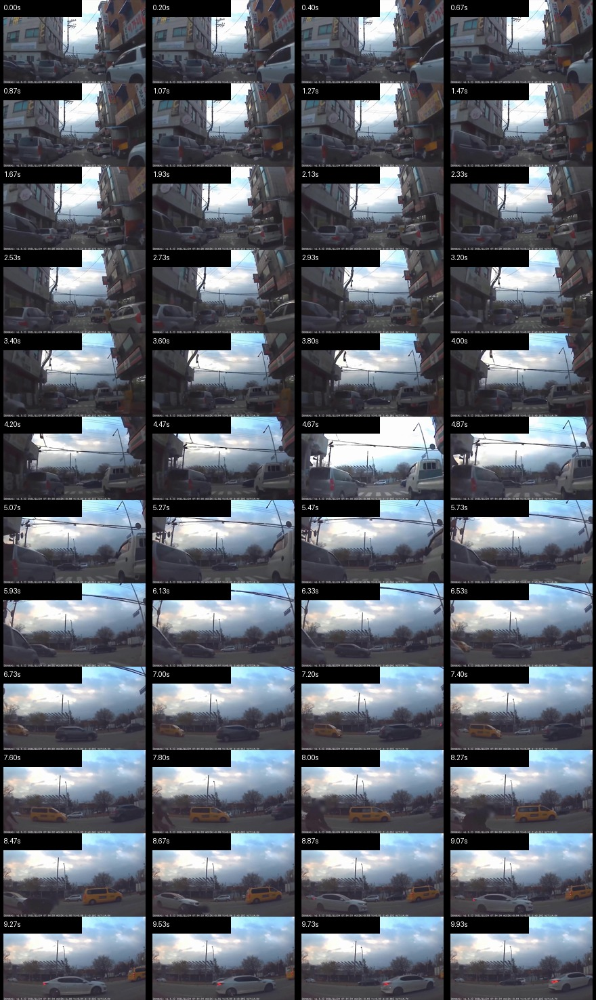

### 차대차 / aihub_train_00010617 / unclear / exclude

{
  "asset_id": "aihub_train_00010617",
  "coarse_label": "차대차",
  "accident_visibility": "unclear",
  "recommended_use": "exclude",
  "video_path": "/workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대차/aihub_train_00010617_bb_1_140205_vehicle_46_227.mp4",
  "contact_sheet": "/workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_frame_inspection/aihub_train_00010617/contact_sheet.jpg",
  "opened": true,
  "frame_count": 150,
  "fps": 15.0,
  "width": 1920,
  "height": 1080,
  "duration_sec": 10.0
}


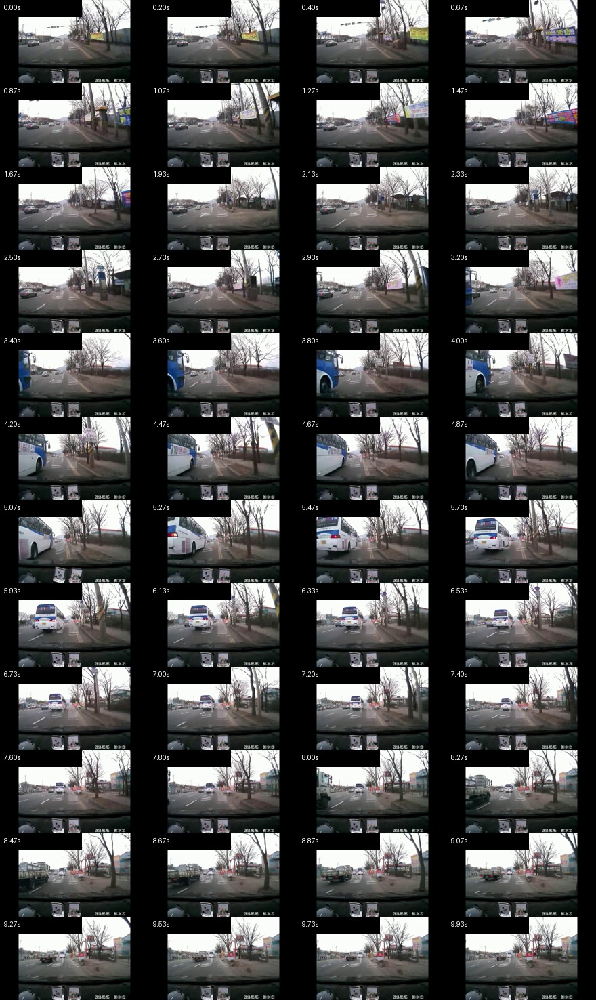

### 차대이륜차 / aihub_train_00001810 / unclear / review

{
  "asset_id": "aihub_train_00001810",
  "coarse_label": "차대이륜차",
  "accident_visibility": "unclear",
  "recommended_use": "review",
  "video_path": "/workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대이륜차/aihub_train_00001810_bb_1_170927_two-wheeled-vehicle_31_001.mp4",
  "contact_sheet": "/workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_frame_inspection/aihub_train_00001810/contact_sheet.jpg",
  "opened": true,
  "frame_count": 150,
  "fps": 15.0,
  "width": 1920,
  "height": 1080,
  "duration_sec": 10.0
}


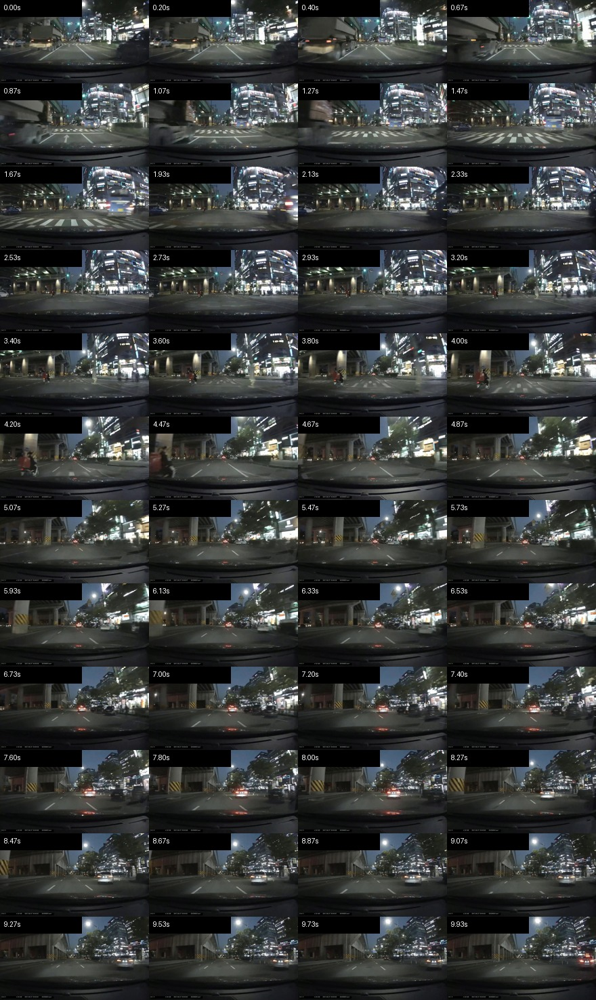

### 차대자전거 / aihub_train_00002836 / unclear / review

{
  "asset_id": "aihub_train_00002836",
  "coarse_label": "차대자전거",
  "accident_visibility": "unclear",
  "recommended_use": "review",
  "video_path": "/workspace/SKN27-FINAL-3Team/storage/vision/datasets/classification/raw_videos/차대자전거/aihub_train_00002836_cc_3_200303_bike_116_279.mp4",
  "contact_sheet": "/workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_frame_inspection/aihub_train_00002836/contact_sheet.jpg",
  "opened": true,
  "frame_count": 150,
  "fps": 15.0,
  "width": 1920,
  "height": 1080,
  "duration_sec": 10.0
}


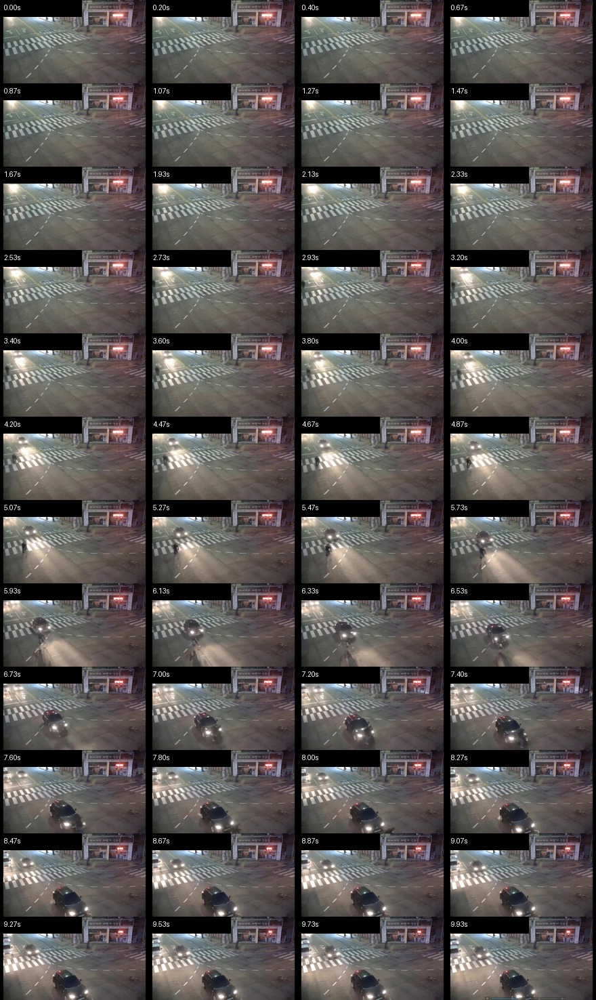

summary_path: /workspace/SKN27-FINAL-3Team/storage/vision/outputs/qwen_frame_inspection/frame_inspection_summary.csv


In [5]:
summary_rows = []
for row in selected_rows:
    asset_id = row.get("asset_id") or Path(row["resolved_path"]).stem
    video_path = Path(row["resolved_path"])
    out_dir = FRAME_OUTPUT_DIR / asset_id
    meta = video_meta(video_path)
    frame_items = extract_uniform_frames(video_path, out_dir, FRAME_COUNT)
    sheet_path = make_contact_sheet(frame_items, out_dir / "contact_sheet.jpg")

    summary = {
        "asset_id": asset_id,
        "coarse_label": row.get("coarse_label", ""),
        "accident_visibility": row.get("accident_visibility", ""),
        "recommended_use": row.get("recommended_use", ""),
        "video_path": video_path.as_posix(),
        "contact_sheet": sheet_path.as_posix(),
        **meta,
    }
    summary_rows.append(summary)

    display(Markdown(f"### {summary['coarse_label']} / {asset_id} / {summary['accident_visibility']} / {summary['recommended_use']}"))
    print(json.dumps(summary, ensure_ascii=False, indent=2))
    display(Image.open(sheet_path))

summary_path = FRAME_OUTPUT_DIR / "frame_inspection_summary.csv"
summary_path.parent.mkdir(parents=True, exist_ok=True)
if summary_rows:
    fields = list(summary_rows[0].keys())
    with summary_path.open("w", encoding="utf-8", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=fields)
        writer.writeheader()
        writer.writerows(summary_rows)
print("summary_path:", summary_path)


## Qwen 48프레임 이미지 묶음 분석
### Contact sheet에서 확인한 같은 48프레임을 video input 대신 image list로 Qwen에 전달

In [6]:
import torch
from transformers import AutoProcessor, Qwen2_5_VLForConditionalGeneration
from qwen_vl_utils import process_vision_info

MODEL_ID = "Qwen/Qwen2.5-VL-3B-Instruct"
QWEN_FRAME_IMAGE_OUTPUT_DIR = FRAME_OUTPUT_DIR / "qwen_frame_bundle"
QWEN_FRAME_IMAGE_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

FRAME_PROMPT = "\n".join([
    '당신은 교통사고 블랙박스 영상의 데이터 품질을 평가하는 비전 에이전트입니다.',
    '입력은 한 영상에서 시간 순서대로 균등 추출한 48장의 프레임입니다.',
    '반드시 유효한 JSON 객체 하나만 출력하세요. 마크다운과 추가 설명은 출력하지 마세요.',
    '모든 문자열 값은 한국어로 작성하세요.',
    '',
    '목표는 학습 데이터로 쓸 수 있을 만큼 사고 장면이 명확한지 판단하는 것입니다.',
    '과실비율, 법적 책임, 가해자/피해자는 확정하지 마세요.',
    '',
    '필수 필드:',
    'accident_visible, accident_visibility, collision_moment_visible, visible_evidence, recommended_use, reason, uncertainties',
    '',
    '허용 값:',
    '- accident_visible: true | false | uncertain',
    '- accident_visibility: clear | unclear | not_visible | uncertain',
    '- collision_moment_visible: true | false | uncertain',
    '- recommended_use: train | review | exclude',
    '',
    '판단 기준:',
    '- train: 충돌 또는 사고 직전/직후 상황이 영상에서 비교적 명확함',
    '- review: 사고 가능성은 있으나 장면이 애매하거나 객체가 작음',
    '- exclude: 사고 장면이 보이지 않거나 학습 신호가 거의 없음',
])


def extract_json_object(text):
    text = text.strip()
    if text.startswith("```"):
        text = text.strip("`").strip()
        if text.lower().startswith("json"):
            text = text[4:].strip()
    start = text.find("{")
    end = text.rfind("}")
    if start == -1 or end == -1 or end <= start:
        raise ValueError("JSON object not found")
    return json.loads(text[start:end + 1])


def frame_paths_for_asset(asset_id):
    frame_dir = FRAME_OUTPUT_DIR / asset_id
    return sorted(frame_dir.glob("frame_*.jpg"))[:FRAME_COUNT]


def qwen_analyze_frames(frame_paths, model, processor):
    content = [
        {"type": "image", "image": str(path), "max_pixels": 640 * 360}
        for path in frame_paths
    ]
    content.append({"type": "text", "text": FRAME_PROMPT})
    messages = [{"role": "user", "content": content}]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(text=[text], images=image_inputs, videos=video_inputs, padding=True, return_tensors="pt").to(model.device)
    with torch.no_grad():
        generated_ids = model.generate(**inputs, max_new_tokens=512, do_sample=False)
    output_text = processor.batch_decode(generated_ids[:, inputs.input_ids.shape[1]:], skip_special_tokens=True)[0]
    try:
        parsed = extract_json_object(output_text)
        return parsed, output_text, True, ""
    except Exception as exc:
        return {}, output_text, False, str(exc)


model = Qwen2_5_VLForConditionalGeneration.from_pretrained(MODEL_ID, torch_dtype="auto", device_map="auto")
processor = AutoProcessor.from_pretrained(MODEL_ID)

frame_qwen_rows = []
jsonl_path = QWEN_FRAME_IMAGE_OUTPUT_DIR / "qwen_frame_bundle_results.jsonl"
with jsonl_path.open("w", encoding="utf-8") as jsonl:
    for row in selected_rows:
        asset_id = row.get("asset_id") or Path(row["resolved_path"]).stem
        frame_paths = frame_paths_for_asset(asset_id)
        if not frame_paths:
            print("SKIP no frames:", asset_id)
            continue
        parsed, raw_output, valid, error = qwen_analyze_frames(frame_paths, model, processor)
        result = {
            "asset_id": asset_id,
            "coarse_label": row.get("coarse_label", ""),
            "frame_count": len(frame_paths),
            "qwen_json_valid": str(valid),
            "parse_error": error,
            "accident_visible": parsed.get("accident_visible", ""),
            "accident_visibility": parsed.get("accident_visibility", ""),
            "collision_moment_visible": parsed.get("collision_moment_visible", ""),
            "recommended_use": parsed.get("recommended_use", ""),
            "reason": parsed.get("reason", ""),
            "visible_evidence": json.dumps(parsed.get("visible_evidence", []), ensure_ascii=False),
            "uncertainties": json.dumps(parsed.get("uncertainties", []), ensure_ascii=False),
            "raw_output_text": raw_output,
        }
        frame_qwen_rows.append(result)
        jsonl.write(json.dumps(result, ensure_ascii=False) + "\n")
        print(asset_id, result["accident_visibility"], result["recommended_use"], "valid=", valid)
        print(raw_output[:1200])

csv_path = QWEN_FRAME_IMAGE_OUTPUT_DIR / "qwen_frame_bundle_results.csv"
if frame_qwen_rows:
    fields = list(frame_qwen_rows[0].keys())
    with csv_path.open("w", encoding="utf-8", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=fields)
        writer.writeheader()
        writer.writerows(frame_qwen_rows)
print("qwen_frame_bundle_csv:", csv_path)
print("qwen_frame_bundle_jsonl:", jsonl_path)


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/824 [00:00<?, ?it/s]

aihub_train_00003410 unclear review valid= True
```json
{
  "accident_visible": true,
  "accident_visibility": "unclear",
  "collision_moment_visible": false,
  "visible_evidence": "uncertain",
  "recommended_use": "review",
  "reason": "The scene is not clearly visible, and the presence of an accident or collision moment cannot be confirmed.",
  "uncertainties": [
    "The visibility of the accident or collision moment is unclear.",
    "The presence of visible evidence for the accident is uncertain."
  ]
}
```
aihub_train_00010617 unclear review valid= True
```json
{
  "accident_visible": false,
  "accident_visibility": "unclear",
  "collision_moment_visible": false,
  "visible_evidence": "uncertain",
  "recommended_use": "review",
  "reason": "The video does not show any clear evidence of an accident or collision.",
  "uncertainties": [
    "The visibility of the accident is unclear due to the lack of distinct visual cues."
  ]
}
```
aihub_train_00001810 unclear review valid= True
`